### 환경 설정

In [ ]:
import os, re, json
from IPython.display import Image, display
import class_MultimodalLLM_QA_251107 as mLLM
import class_Media_Edit_251107 as ME
import class_PromptBank_251107 as PB

from dotenv import load_dotenv
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

if not api_key:
    raise ValueError("OPENAI_API_KEY 환경변수가 설정되지 않았습니다. .env 파일에 'OPENAI_API_KEY=your-key' 형식으로 추가하세요.")
llm_name = "gpt-4o"  
mllm = mLLM.multimodalLLM(llm_name=llm_name, api_key=api_key)
videoEdit = ME.MediaEdit()
promptBank = PB.PromptBank()


: 

In [5]:
base_dir = r"/workspace/app/video_source"
video_path = base_dir + r"/240816_올바른 흡입기영상(정면).mp4"
video_path_ck = base_dir + r"/240816_올바른 흡입기영상(측면).mp4"
video_path = base_dir + r"/How to Use a Metered-Dose Inhaler without a Valved Holding Chamber.mp4"
video_path = base_dir + r"/Inhaler_Usage.mp4"
video_path = base_dir + r"/삼성서울병원.mp4"

video_path = base_dir + r"/DPI/01_Ellipta_full.mov"
video_path = base_dir + r"/DPI/03_genuair_full.mov"
video_path = base_dir + r"/DPI/04_Ellipta_full.mov"  # faceOFFinhaler 오류, 흡입기를 손으로 많이 감쌈
video_path = base_dir + r"/DPI/07_breezhaler_full.mov"
video_path = base_dir + r"/DPI/08_Nexthaler_full.mov"
video_path = base_dir + r"/DPI/점수낮은사람/02_Ellipta_zoom.MOV"  # 세로 영상
video_path = base_dir + r"/DPI/점수낮은사람/03_genuair_full.mov"
video_path = base_dir + r"/DPI/점수낮은사람/05_Ellipta_zoom01.MOV"  # 세로 영상

video_path = base_dir + r"/pMDI/01_pMDI_full.mov"
video_path_ck = base_dir + r"/pMDI/04_pMDI_full.mov"
video_path = base_dir + r"/pMDI/05_rapihaler_full.mov"
video_path = base_dir + r"/pMDI/06_ventolin_full.mov"
video_path = base_dir + r"/pMDI/08_Foster_full.mov"
video_path = base_dir + r"/pMDI/점수 낮은 사람/09_ventolin_zoom01.MOV"  # 세로 영상
video_path = base_dir + r"/pMDI/점수 낮은 사람/13_ventolin_zoom.MOV"  # 영상 촬영 오류 있음

video_path_selected = base_dir + r"/SMI/03_SMI_full.mov"
video_path = base_dir + r"/SMI/04_SMI_full.mov"
video_path = base_dir + r"/SMI/05_SMI_full.mov"
video_path = base_dir + r"/SMI/06_SMI_full.mov"
video_path = base_dir + r"/SMI/07_SMI_full.mov"
video_path = base_dir + r"/SMI/점수 낮은 사람/01_SMI_zoom.MOV"  # 세로 영상
video_path = base_dir + r"/SMI/점수 낮은 사람/02_SMI_zoom.MOV"  # 세로 영상

video_path_selected = base_dir + r"/pMDI/10_Foster_full.mov"

VIDEO_PATH = video_path_selected
print(f"{VIDEO_PATH=}")

# query video info
video_name, play_time, frame_count, video_width, video_height, file_size = videoEdit.query_videoInfo(VIDEO_PATH)
print(f"{video_name=} Time: {play_time} sec, Length: {frame_count} frames, Resolution: {video_width}x{video_height} px, File: {file_size:,} Byte")


def search_reference_time_check_action_step(system_prompt, user_prompt, play_time, start_time=0, segment_time=5, offset_time=1, sampling_time=0.3, show=True):
    """
    비디오에서 기준 시간을 찾고 행동 단계를 판단하는 함수
    Args:
        system_prompt (str): GPT 시스템 프롬프트
        user_prompt (str): GPT 사용자 프롬프트
        play_time (float): 비디오 재생 시간(초)
        start_time (float): 검색 시작 시간(초)
        segment_time (float): 분석할 구간 길이(초)
        offset_time (float): 검색 시 이동할 시간 간격(초)
        show (bool): 이미지 표시 여부
    Returns:
        tuple: (reference_time, frame_detected, q_answers_accumulated)
            - reference_time (float): 기준 시간(초)
            - frame_detected (int): 감지된 프레임 번호
            - q_answers_accumulated (dict): 누적된 Q&A 결과 {Q1: [(time, answer), ...], Q2: [...], ...}
    """
    #output_dir_temp = "output_video_MxN_image_for_reference_time"
    M, N = 1, int(segment_time / sampling_time)  # SAMPLING_TIME 간격으로 추출하여 판단
    gridSize = (int(1280/2)*N, int(720/2)*M)  # 토큰 절약을 위하여 해상도를 조정함. 1920x1080, 1280×720, 854×480.

    # 누적 저장용 딕셔너리 초기화
    q_answers_accumulated = {}
    final_frame_detected = 0
    final_start_time = start_time

    while start_time <= play_time - segment_time:
        print(f'\n\n##### {start_time= :.1f}')
        end_time = start_time + segment_time
        
        output_image, image_W, image_H = videoEdit.extract_frames_to_MxN_image(
            option='time', 
            start=start_time,
            end=end_time,
            MxN=(M, N),
            video_path=VIDEO_PATH,
            output_dir=None,  # None이면 image_array를 반환하고 파일을 생성하지 않음
            gridSize=gridSize,
            padSize=(0, 0)
        )
        
        # 이미지는 image_array 형태로 전달
        response = mllm.query_answer_chatGPT(system_prompt, user_prompt, image_array=output_image)
        if show:
            print(f"response={response}")

        # response 분석하여 필요한 정보 추출
        frame_detected = 0
        current_q_answers = {}
        current_q_confidence = {}
        overall_answer = None
        
        try:
            # Overall_Answer 추출 (개별 이미지 분석 결과)
            overall_pattern = re.compile(r'\*{0,2}Overall_Answer:\s*\*{0,2}\s*(YES|NO)', re.IGNORECASE)
            overall_match = overall_pattern.search(response)
            if overall_match:
                overall_answer = overall_match.group(1).upper()
                
            # Overall_Answer가 YES이면 첫 번째 프레임으로 설정
            if overall_answer == "YES":
                frame_detected = 0
            else:
                frame_detected = None
                
            # Q1_Answer, Q2_Answer, Q3_Answer, ... 추출
            q_pattern = re.compile(r'\*{0,2}Q(\d+)_Answer:\s*\*{0,2}\s*(YES|NO)', re.IGNORECASE)
            q_matches = q_pattern.findall(response)
            
            # Q1_Confidence, Q2_Confidence, Q3_Confidence, ... 추출
            confidence_pattern = re.compile(r'\*{0,2}Q(\d+)_Confidence:\s*\*{0,2}\s*(\d+(?:\.\d+)?)', re.IGNORECASE)
            confidence_matches = confidence_pattern.findall(response)
            
            # 현재 루프의 Q&A 결과를 임시 저장
            for q_num, answer in q_matches:
                current_q_answers[f'Q{q_num}'] = answer.upper()
            
            # 현재 루프의 Confidence 결과를 임시 저장
            for q_num, confidence in confidence_matches:
                try:
                    current_q_confidence[f'Q{q_num}'] = float(confidence)
                except ValueError:
                    current_q_confidence[f'Q{q_num}'] = None
            
            # 누적 딕셔너리에 저장 (리스트로 누적)
            for q_key, answer in current_q_answers.items():
                if q_key not in q_answers_accumulated:
                    q_answers_accumulated[q_key] = []
                # confidence가 있으면 함께 저장, 없으면 None
                confidence = current_q_confidence.get(q_key, None)
                q_answers_accumulated[q_key].append((round(start_time, 1), answer, confidence))
                
        except (ValueError, IndexError) as e:
            if show:
                print(f"오류 발생: {e}")
            frame_detected = 0
        
        if show:
            print(f'----->')
            print(f"start_time= {start_time:.1f}, frame_detected= {frame_detected}-th")
            print(f"Overall_Answer= {overall_answer}")
            print(f"Current Q_Answers= {current_q_answers}")
            print(f"Current Q_Confidence= {current_q_confidence}")
            print(f"Accumulated Q_Answers= {q_answers_accumulated}")
        
        # 종료 조건: Overall_Answer가 YES인 경우 종료
        if overall_answer == "YES":
            final_frame_detected = frame_detected
            final_start_time = round(start_time, 1)
            break
    
        start_time += offset_time

    # 루프 종료 후 처리
    if start_time <= play_time - segment_time:
        if show:
            # 이미지 표시를 위해 임시로 파일로 저장 (표시용)
            import tempfile
            import cv2
            with tempfile.NamedTemporaryFile(suffix='.png', delete=False) as tmp_file:
                cv2.imwrite(tmp_file.name, output_image)
                displaySize = gridSize
                try:
                    display(Image(filename=tmp_file.name, width=displaySize[0], height=displaySize[1]))
                except ImportError:
                    print("IPython.display를 사용할 수 없어서, 이미지 표시를 건너뜁니다.")
                finally:
                    # 임시 파일 삭제
                    os.unlink(tmp_file.name)  # windows 환경에서는 오류 발생 가능성 있음
                    """try:
                        import pathlib
                        pathlib.Path(tmp_file.name).unlink()
                    except Exception as e:
                        print(f"임시 파일 삭제 중 오류 발생: {e}")"""
    else:
        print("\n **영상 거의 끝까지 탐색했습니다.**")
        final_start_time = round(start_time - offset_time, 1)
        final_frame_detected = None  # 기본값 설정
        
    return final_start_time, final_frame_detected, q_answers_accumulated

VIDEO_PATH='/workspace/app/video_source/pMDI/10_Foster_full.mov'
video_name='10_Foster_full' Time: 30.75 sec, Length: 922 frames, Resolution: 1920x1080 px, File: 33,765,202 Byte


### init ~ inhalerIN: 흡입기가 처음으로 보이는 시각까지



##### start_time= 0.0
response=Overall_Answer: YES  
Reason: 각 이미지에서 사람이 물체를 들고 있는 것으로 보입니다.

Q1_Answer: YES
----->
start_time= 0.0, frame_detected= 0-th
Overall_Answer= YES
Current Q_Answers= {'Q1': 'YES'}
Accumulated Q_Answers= {'Q1': [(0.0, 'YES')]}


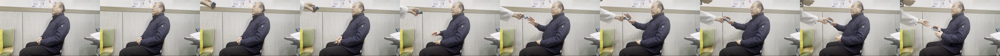

reference_time= 0.0
q_answers= {'Q1': [(0.0, 'YES')]}


=== search_reference_time ===
inhalerIN:
  action: Is the inhaler visible at any point throughout the images?
  reference_time: 0.0

faceONinhaler:
  action: Is the person holding an object to the mouth as if using an inhaler?
  reference_time: 0

inhalerOUT:
  action: Is the inhaler invisible at any point throughout the images?
  reference_time: 0

=== check_action_step_common ===
sit_stand:
  action: Is the user sitting or standing upright?(Consider the user to be upright, even if they are sitting with a slight forward lean.)
  timeANDscore: [(0.0, 1)]

remove_cover:
  action: Is the user removing the mouthpiece cover?
  timeANDscore: []

inspect_mouthpiece:
  action: Is the user inspecting the mouthpiece for foreign substances?
  timeANDscore: []

shake_inhaler:
  action: Is the user shaking the inhaler well?
  timeANDscore: []

hold_inhaler:
  action: Is the user holding the inhaler upright?
  timeANDscore: []

load_dose:
  ac

In [6]:
start_time = 0.0  # 초 단위로 입력

segment_time = 3.0  # <--- 여기만 변경하세요.
sampling_time = segment_time / 10.
#offset_time = segment_time - sampling_time
offset_time = segment_time

system_prompt = "You are a helpful assistant that analyzes images and videos to determine if the user is performing a specific action."
user_prompt = f"""
[Task 1] Individual Image Analysis
Analyze each image independently without using context from other images.

Question: {promptBank.search_reference_time['inhalerIN']['action']}

* Judgment Criteria (apply all):
- Each image is evaluated as a standalone frame.
- If the person holds an object, treat it as an inhaler.
- If consecutive images satisfy the above conditions, the overall answer is YES; otherwise, NO.

* Output Format:
Overall_Answer: [YES or NO]  
Reason: {{Explain the decision very shortly in Korean.}}

[Task 2] Sequential Video Analysis
Analyze the sequence of images as consecutive video frames.

Q1: {promptBank.check_action_step_common['sit_stand']['action']}

* Judgment Criteria (apply all):
- Treat all frames as parts of a continuous video.
- Use temporal continuity to determine whether the inhaler appears across frames.
- Allow inference of inhaler visibility even if partially obscured in some frames, based on continuity.

* Output Format:
Q1_Answer: [YES or NO]
Q1_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
"""

#print(f"user_prompt={user_prompt}")
final_start_time, _, q_answers_acc = search_reference_time_check_action_step(system_prompt, user_prompt, play_time, start_time, segment_time, offset_time, sampling_time, show=True)
reference_time_inhalerIN = final_start_time
print("="*10)
print("reference_time=", reference_time_inhalerIN)
print("q_answers=", q_answers_acc)

# Q&A 매핑 정의
q_mapping_inhalerIN = {
    'Q1': 'sit_stand'
}

# PromptBank에 저장
promptBank.save_to_promptbank('inhalerIN', reference_time_inhalerIN, q_answers_acc, q_mapping_inhalerIN)

# PromptBank에 저장된 내용 출력
print("\n\n=============================")
print("=== search_reference_time ===")
for key, value in promptBank.search_reference_time.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()

print("=== check_action_step_common ===")
for key, value in promptBank.check_action_step_common.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()

### inhalerIN ~ faceONinhaler: 흡입기를 처음으로 입에 대는 시각까지



##### start_time= 0.0
response=**[Task 1] Individual Image Analysis**

Overall_Answer: NO  
Reason: 각 이미지에서 입에 물체를 대고 있는 모습이 보이지 않습니다.

**[Task 2] Sequential Video Analysis**

Q1_Answer: YES  
Q2_Answer: NO  
Q3_Answer: NO  
Q4_Answer: NO  
Q5_Answer: NO  
Q6_Answer: NO  
Q7_Answer: NO  
Q8_Answer: NO  
----->
start_time= 0.0, frame_detected= None-th
Overall_Answer= NO
Current Q_Answers= {'Q1': 'YES', 'Q2': 'NO', 'Q3': 'NO', 'Q4': 'NO', 'Q5': 'NO', 'Q6': 'NO', 'Q7': 'NO', 'Q8': 'NO'}
Accumulated Q_Answers= {'Q1': [(0.0, 'YES')], 'Q2': [(0.0, 'NO')], 'Q3': [(0.0, 'NO')], 'Q4': [(0.0, 'NO')], 'Q5': [(0.0, 'NO')], 'Q6': [(0.0, 'NO')], 'Q7': [(0.0, 'NO')], 'Q8': [(0.0, 'NO')]}


##### start_time= 2.0
response=**[Task 1] Individual Image Analysis**

Overall_Answer: NO  
Reason: 각 이미지에서 입에 물체를 대고 있는 모습이 보이지 않습니다.

**[Task 2] Sequential Video Analysis**

Q1_Answer: YES  
Q2_Answer: NO  
Q3_Answer: NO  
Q4_Answer: NO  
Q5_Answer: NO  
Q6_Answer: NO  
Q7_Answer: YES  
Q8_Answer: NO  
----->
s

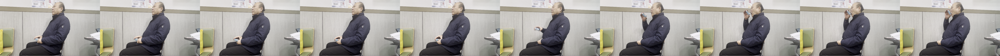

reference_time= 4.0
q_answers= {'Q1': [(0.0, 'YES'), (2.0, 'YES'), (4.0, 'YES')], 'Q2': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'NO')], 'Q3': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'NO')], 'Q4': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'NO')], 'Q5': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'YES')], 'Q6': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'NO')], 'Q7': [(0.0, 'NO'), (2.0, 'YES'), (4.0, 'NO')], 'Q8': [(0.0, 'NO'), (2.0, 'NO'), (4.0, 'YES')]}


=== search_reference_time ===
inhalerIN:
  action: Is the inhaler visible at any point throughout the images?
  reference_time: 0.0

faceONinhaler:
  action: Is the person holding an object to the mouth as if using an inhaler?
  reference_time: 4.0

inhalerOUT:
  action: Is the inhaler invisible at any point throughout the images?
  reference_time: 0

=== check_action_step_common ===
sit_stand:
  action: Is the user sitting or standing upright?(Consider the user to be upright, even if they are sitting with a slight forward lean.)
  timeANDscore: [(0.0, 1), (0.0, 1), (2.0, 1), (

In [7]:
start_time = reference_time_inhalerIN  # 초 단위로 입력

segment_time = 2.0  # <--- 여기만 변경하세요.
sampling_time = segment_time / 10.
#offset_time = segment_time - sampling_time
offset_time = segment_time

system_prompt = "You are a helpful assistant that analyzes images and videos to determine if the user is performing a specific action."
user_prompt = f"""
[Task 1] Individual Image Analysis
Analyze each image independently without using context from other images.

Question: {promptBank.search_reference_time['faceONinhaler']['action']}

* Judgment Criteria (apply all):
- Each image is evaluated as a standalone frame.
- If the person holds an object, treat it as an inhaler.
- If consecutive images satisfy the above conditions, the overall answer is YES; otherwise, NO.

* Output Format:
Overall_Answer: [YES or NO]  
Reason: {{Explain the decision very shortly in Korean.}}

[Task 2] Sequential Video Analysis
Analyze the sequence of images as consecutive video frames.

Q1. {promptBank.check_action_step_common['sit_stand']['action']}
Q2. {promptBank.check_action_step_common['remove_cover']['action']}
Q3. {promptBank.check_action_step_common['inspect_mouthpiece']['action']}
Q4. {promptBank.check_action_step_common['shake_inhaler']['action']}
Q5. {promptBank.check_action_step_common['hold_inhaler']['action']}
Q6. {promptBank.check_action_step_common['load_dose']['action']}
Q7. {promptBank.check_action_step_common['exhale_before']['action']}
Q8. {promptBank.check_action_step_common['seal_lips']['action']}

* Judgment Criteria (apply all):
- Treat all frames as parts of a continuous video.
- Use temporal continuity to determine whether the inhaler appears across frames.
- Allow inference of inhaler visibility even if partially obscured in some frames, based on continuity.

* Output Format:
Q1_Answer: [YES or NO]
Q1_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q2_Answer: [YES or NO]
Q2_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q3_Answer: [YES or NO]
Q3_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q4_Answer: [YES or NO]
Q4_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q5_Answer: [YES or NO]
Q5_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q6_Answer: [YES or NO]
Q6_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q7_Answer: [YES or NO]
Q7_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q8_Answer: [YES or NO]
Q8_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
"""

#print(f"user_prompt={user_prompt}")
final_start_time, _, q_answers_acc = search_reference_time_check_action_step(system_prompt, user_prompt, play_time, start_time, segment_time, offset_time, sampling_time, show=True)
reference_time_faceONinhaler = final_start_time

print("="*10)
print("reference_time=", reference_time_faceONinhaler)
print("q_answers=", q_answers_acc)

# Q&A 매핑 정의
q_mapping_faceONinhaler = {
    'Q1': 'sit_stand',
    'Q2': 'remove_cover', 
    'Q3': 'inspect_mouthpiece',
    'Q4': 'shake_inhaler',
    'Q5': 'hold_inhaler',
    'Q6': 'load_dose',
    'Q7': 'exhale_before',
    'Q8': 'seal_lips'
}

# PromptBank에 저장
promptBank.save_to_promptbank('faceONinhaler', reference_time_faceONinhaler, q_answers_acc, q_mapping_faceONinhaler)

# PromptBank에 저장된 내용 출력
print("\n\n=============================")
print("=== search_reference_time ===")
for key, value in promptBank.search_reference_time.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()

print("=== check_action_step_common ===")
for key, value in promptBank.check_action_step_common.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()

### faceONinhaler ~ inhalerOUT: 흡입기가 처음으로 화면에서 사라지는 시각까지

In [8]:
start_time = reference_time_faceONinhaler  # 초 단위로 입력

segment_time = 3.0  # <--- 여기만 변경하세요.
sampling_time = segment_time / 10.
#offset_time = segment_time - sampling_time
offset_time = segment_time

system_prompt = "You are a helpful assistant that analyzes images and videos to determine if the user is performing a specific action."
user_prompt = f"""
[Task 1] Individual Image Analysis
Analyze each image independently without using context from other images.

Question: {promptBank.search_reference_time['inhalerOUT']['action']}

* Judgment Criteria (apply all):
- Each image is evaluated as a standalone frame.
- If the person holds an object, treat it as an inhaler.
- If consecutive images satisfy the above conditions, the overall answer is YES; otherwise, NO.

* Output Format:
Overall_Answer: [YES or NO]  
Reason: {{Explain the decision very shortly in Korean.}}

[Task 2] Sequential Video Analysis
Analyze the sequence of images as consecutive video frames.

Q1. {promptBank.check_action_step_common['seal_lips']['action']}
Q2. {promptBank.check_action_step_common['inhale_deeply']['action']}
Q3. {promptBank.check_action_step_common['remove_inhaler']['action']}
Q4. {promptBank.check_action_step_common['hold_breath']['action']}
Q5. {promptBank.check_action_step_common['exhale_after']['action']}
Q6. {promptBank.check_action_step_common['replace_cover']['action']}

* Judgment Criteria (apply all):
- Treat all frames as parts of a continuous video.
- Use temporal continuity to determine whether the inhaler appears across frames.
- Allow inference of inhaler visibility even if partially obscured in some frames, based on continuity.

* Output Format:
Q1_Answer: [YES or NO]
Q1_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q2_Answer: [YES or NO]
Q2_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q3_Answer: [YES or NO]
Q3_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q4_Answer: [YES or NO]
Q4_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q5_Answer: [YES or NO]
Q5_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
Q6_Answer: [YES or NO]
Q6_Confidence: [0.0 to 1.0, indicating your confidence level in the answer]
"""

#print(f"user_prompt={user_prompt}")
final_start_time, _, q_answers_acc = search_reference_time_check_action_step(system_prompt, user_prompt, play_time, start_time, segment_time, offset_time, sampling_time, show=True)
reference_time_inhalerOUT = final_start_time
print("="*10)
print("reference_time=", reference_time_inhalerOUT)
print("q_answers=", q_answers_acc)

# Q&A 매핑 정의 
q_mapping_inhalerOUT = {
    'Q1': 'seal_lips',
    'Q2': 'inhale_deeply',
    'Q3': 'remove_inhaler',
    'Q4': 'hold_breath',
    'Q5': 'exhale_after',
    'Q6': 'replace_cover',
}

# PromptBank에 저장
promptBank.save_to_promptbank('inhalerOUT', reference_time_inhalerOUT, q_answers_acc, q_mapping_inhalerOUT)

# PromptBank에 저장된 내용 출력
print("\n\n=============================")
print("=== search_reference_time ===")
for key, value in promptBank.search_reference_time.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()

print("=== check_action_step_common ===")
for key, value in promptBank.check_action_step_common.items():
    print(f"{key}:")
    for sub_key, sub_value in value.items():
        print(f"  {sub_key}: {sub_value}")
    print()



##### start_time= 4.0
response=**[Task 1] Individual Image Analysis**

Overall_Answer: NO  
Reason: 각 이미지에서 흡입기가 보입니다.

**[Task 2] Sequential Video Analysis**

Q1_Answer: YES  
Q2_Answer: YES  
Q3_Answer: YES  
Q4_Answer: YES  
Q5_Answer: YES  
Q6_Answer: NO  
----->
start_time= 4.0, frame_detected= None-th
Overall_Answer= NO
Current Q_Answers= {'Q1': 'YES', 'Q2': 'YES', 'Q3': 'YES', 'Q4': 'YES', 'Q5': 'YES', 'Q6': 'NO'}
Accumulated Q_Answers= {'Q1': [(4.0, 'YES')], 'Q2': [(4.0, 'YES')], 'Q3': [(4.0, 'YES')], 'Q4': [(4.0, 'YES')], 'Q5': [(4.0, 'YES')], 'Q6': [(4.0, 'NO')]}


##### start_time= 7.0
response=**[Task 1] Individual Image Analysis**

Overall_Answer: NO  
Reason: 각 이미지에서 흡입기가 보입니다.

**[Task 2] Sequential Video Analysis**

Q1_Answer: YES  
Q2_Answer: YES  
Q3_Answer: YES  
Q4_Answer: YES  
Q5_Answer: YES  
Q6_Answer: NO  
----->
start_time= 7.0, frame_detected= None-th
Overall_Answer= NO
Current Q_Answers= {'Q1': 'YES', 'Q2': 'YES', 'Q3': 'YES', 'Q4': 'YES', 'Q5': 'YES', 'Q6

### 종합 분석

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 모든 키와 y 위치 설정
reference_keys = list(promptBank.search_reference_time.keys())
action_keys = list(promptBank.check_action_step_common.keys())
all_keys = reference_keys + action_keys
y_positions = {key: i * 0.1 for i, key in enumerate(all_keys)}
min_time, max_time = -1.0, play_time - segment_time

# plotly figure 생성
fig = go.Figure()

# 스트라이프 그리기 (reference_time 키에는 gray, action_step 키에는 lightgray)
for key, y_pos in y_positions.items():
    if key in reference_keys:
        # reference_time 키에 대한 파란색 수평선
        fig.add_shape(
            type="line",
            x0=0, y0=y_pos, x1=1, y1=y_pos,
            xref="paper", yref="y",
            line=dict(color="blue", width=10),
            opacity=0.3
        )
    else:  # action_keys
        # action_step 키에 대한 회색 수평선
        fig.add_shape(
            type="line",
            x0=0, y0=y_pos, x1=1, y1=y_pos,
            xref="paper", yref="y",
            line=dict(color="gray", width=10),
            opacity=0.3
        )

# X축 범위 계산을 위한 모든 시간 수집
all_times = []
# reference_time 수집
for v in promptBank.search_reference_time.values():
    if v['reference_time'] >= 0:
        all_times.append(float(v['reference_time']))
# timeANDscore에서 시간 수집
for v in promptBank.check_action_step_common.values():
    if v['timeANDscore']:
        for time_score in v['timeANDscore']:
            # 시간값을 float로 변환하여 추가
            all_times.append(float(time_score[0]))

# reference_time에 파란색 점과 수직선 그리기
reference_times = []
reference_y_pos = []
reference_texts = []

for key, value in promptBank.search_reference_time.items():
    if value['reference_time'] >= 0:  # 시간이 설정된 경우만
        y_pos = y_positions[key]
        
        # 수직선 추가
        fig.add_shape(
            type="line",
            x0=value['reference_time'], y0=min(y_positions.values()) - 0.05,
            x1=value['reference_time'], y1=max(y_positions.values()) + 0.05,
            line=dict(color="blue", width=1.5),
            opacity=0.7
        )
        
        reference_times.append(value['reference_time'])
        reference_y_pos.append(y_pos)
        reference_texts.append(f"{value['reference_time']:.1f}s")

# reference_time 점들 추가
if reference_times:
    fig.add_trace(go.Scatter(
        x=reference_times,
        y=reference_y_pos,
        mode='markers+text',
        marker=dict(size=12, color='blue'),
        text=reference_texts,
        textposition="top center",
        textfont=dict(size=9, color='blue'),
        name='Reference Time',
        showlegend=False,
        hovertemplate='Reference Time: %{x:.1f}s<extra></extra>'
    ))

# score와 confidence에 따라 점 스타일 및 색상 설정
action_times_filled = []
action_y_pos_filled = []
action_keys_filled = []
action_confidence_filled = []
action_times_empty = []
action_y_pos_empty = []
action_keys_empty = []
action_confidence_empty = []

# confidence_score를 딕셔너리로 변환 (빠른 검색을 위해)
confidence_dict = {}
for key, value in promptBank.check_action_step_common.items():
    if value['confidence_score']:
        confidence_dict[key] = {time: conf for time, conf in value['confidence_score']}

# search_reference_time 데이터 출력
print("--- Reference Time 데이터 ---")
for key, value in promptBank.search_reference_time.items():
    print(f"{key}: {value['action']}")
    print(f"       {value['reference_time']}")
# check_action_step_common 데이터 출력
print("--- Action Step 데이터 ---")
for key, value in promptBank.check_action_step_common.items():
    if value['timeANDscore']:  # 데이터가 있는 경우만
        print(f"{key}: {value['action']}")
        print(f"       {value['timeANDscore']}")
        if value['confidence_score']:
            print(f"       confidence: {value['confidence_score']}")
        y_pos = y_positions[key]
        for time_score in value['timeANDscore']:
            time_val = float(time_score[0])  # 시간값을 float로 변환
            score_val = time_score[1]
            
            # 해당 시간의 confidence score 찾기
            confidence_val = confidence_dict.get(key, {}).get(time_val, 0.5)  # 기본값 0.5
            
            if score_val == 1:  # YES → score=1 → 채워진 점
                action_times_filled.append(time_val)
                action_y_pos_filled.append(y_pos)
                action_keys_filled.append(key)
                action_confidence_filled.append(confidence_val)
            elif score_val == 0:  # NO → score=0 → 빈 점
                action_times_empty.append(time_val)
                action_y_pos_empty.append(y_pos)
                action_keys_empty.append(key)
                action_confidence_empty.append(confidence_val)

# score=1인 action step 점들 추가 (채워진 점, confidence에 따라 색상 농도 변화)
if action_times_filled:
    fig.add_trace(go.Scatter(
        x=action_times_filled,
        y=action_y_pos_filled,
        mode='markers',
        marker=dict(
            size=10, 
            color=action_confidence_filled,  # confidence 값으로 색상 설정
            colorscale='Greens',  # 녹색 계열 (낮은 confidence: 연한 녹색, 높은 confidence: 진한 녹색)
            cmin=0.0,
            cmax=1.0,
            symbol='circle',
            colorbar=dict(
                title="Confidence<br>(Score=1)",
                x=1.02,
                y=0.75,
                len=0.4,
                thickness=15
            ),
            line=dict(width=1, color='darkgreen')
        ),
        name='Action Steps (Score=1)',
        showlegend=False,
        hovertemplate='%{text}<br>Time: %{x:.1f}s<br>Score: 1<br>Confidence: %{marker.color:.2f}<extra></extra>',
        text=action_keys_filled
    ))

# score=0인 action step 점들 추가 (빈 점, confidence에 따라 색상 농도 변화)
if action_times_empty:
    fig.add_trace(go.Scatter(
        x=action_times_empty,
        y=action_y_pos_empty,
        mode='markers',
        marker=dict(
            size=10, 
            color=action_confidence_empty,  # confidence 값으로 색상 설정
            colorscale='Reds',  # 빨간색 계열 (낮은 confidence: 연한 빨강, 높은 confidence: 진한 빨강)
            cmin=0.0,
            cmax=1.0,
            symbol='circle-open',
            colorbar=dict(
                title="Confidence<br>(Score=0)",
                x=1.02,
                y=0.25,
                len=0.4,
                thickness=15
            ),
            line=dict(width=2)
        ),
        name='Action Steps (Score=0)',
        showlegend=False,
        hovertemplate='%{text}<br>Time: %{x:.1f}s<br>Score: 0<br>Confidence: %{marker.color:.2f}<extra></extra>',
        text=action_keys_empty
    ))

# 그래프 레이아웃 설정
fig.update_layout(
    title={
        'text': f'Visualization: Reference Time and Action Steps, {llm_name}',
        'x': 0.5,
        'font': {'size': 14, 'family': 'Arial'}
    },
    xaxis=dict(
        title='time (sec)',
        gridcolor='rgba(0,0,0,0.3)',
        gridwidth=1,
        range=[min_time, max_time],
        showgrid=True
    ),
    yaxis=dict(
        title='event',
        tickmode='array',
        tickvals=list(y_positions.values()),
        ticktext=list(y_positions.keys()),
        gridcolor='rgba(0,0,0,0.1)',
        gridwidth=1
    ),
    plot_bgcolor='white',
    width=1000,
    height=600,
    showlegend=False
)

fig.show()
print(f"{video_name=} Time: {play_time} sec, Length: {frame_count} frames, Resolution: {video_width}x{video_height} px, File: {file_size:,} Byte")


--- Reference Time 데이터 ---
inhalerIN: Is the inhaler visible at any point throughout the images?
       0.0
faceONinhaler: Is the person holding an object to the mouth as if using an inhaler?
       4.0
inhalerOUT: Is the inhaler invisible at any point throughout the images?
       25.0
--- Action Step 데이터 ---
sit_stand: Is the user sitting or standing upright?(Consider the user to be upright, even if they are sitting with a slight forward lean.)
       [(0.0, 1), (0.0, 1), (2.0, 1), (4.0, 1)]
remove_cover: Is the user removing the mouthpiece cover?
       [(0.0, 0), (2.0, 0), (4.0, 0)]
inspect_mouthpiece: Is the user inspecting the mouthpiece for foreign substances?
       [(0.0, 0), (2.0, 0), (4.0, 0)]
shake_inhaler: Is the user shaking the inhaler well?
       [(0.0, 0), (2.0, 0), (4.0, 0)]
hold_inhaler: Is the user holding the inhaler upright?
       [(0.0, 0), (2.0, 0), (4.0, 1)]
load_dose: Is the user removing the mouthpiece cover to load the medication?
       [(0.0, 0), (2.0, 0

video_name='10_Foster_full' Time: 30.75 sec, Length: 922 frames, Resolution: 1920x1080 px, File: 33,765,202 Byte


In [10]:
print("Done !")
#TODO action에 흡입기를 물고 있는가 ? 추가 여부 검토
#TODO event 통계신호처리로 최종 Checklist 결과 출력

Done !
